In [1]:
import os

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy.signal import savgol_filter
from scipy.stats import norm

In [2]:
if not os.path.exists('image'):
    os.makedirs('image')

In [3]:
df_cpu_a = pd.read_csv('../real datasets/cpu-full-a.csv')
df_cpu_b = pd.read_csv('../real datasets/cpu-full-b.csv')

In [4]:
# df_cpu_a.head()
# df_cpu_b.head()

# Generate data

In [5]:
# Function to generate random means
def generate_means(N, mean_load, var_load):
    print('Mean Load:', mean_load, '; Variance Load:', var_load)
    means_load = np.random.normal(loc=mean_load, scale=np.sqrt(var_load), size=N)

    # Plotting means_load
    plt.figure(figsize=(12, 6))
    plt.plot(means_load, marker='o', linestyle='-', color='b', label='means_load')
    plt.title('Random Means for Load')
    plt.xlabel('Node')
    plt.ylabel('Mean Load')
    plt.legend()
    plt.grid(True)

    # Adjust layout
    plt.tight_layout()
    plt.show()

    return means_load

In [6]:
# Function to generate IID data
def generate_iid_data(N, T, means_load):
    loads = np.array([np.random.normal(loc=means_load[i], scale=1, size=T) for i in range(N)])

    return loads, np.mean(loads, axis=1)

In [9]:
# Function to generate AR(1) data
def generate_ar1_data(N, T, means_load, theta):
    """
    Generate AR(1) data for multiple nodes.
    
    Parameters:
        N (int): Number of nodes.
        T (int): Number of time steps.
        means_load (array-like): Mean load for each node.
        theta (float): AR(1) process parameter.
    
    Returns:
        load (ndarray): Generated AR(1) load data.
    """
    # print('Theta:', theta)
    loads = np.zeros((N, T))

    def generate_ar1(theta, T, mean_node):
        """
        Generate a single AR(1) time series.
        
        Parameters:
            theta (float): AR(1) process parameter.
            n (int): Number of time steps.
            mean_node (float): Mean load for the node.
        
        Returns:
            ar1 (ndarray): Generated AR(1) time series.
        """
        ar1 = np.zeros(T)
        ar1[0] = mean_node
        for t in range(1, T):
            ar1[t] = theta * ar1[t - 1] + (1 - theta) * mean_node + np.random.normal(0, 1)
        return ar1

    for i in range(N):
        loads[i] = generate_ar1(theta, T, means_load[i])

    return loads, np.mean(loads, axis=1)

Mean Load: 15 ; Variance Load: 10


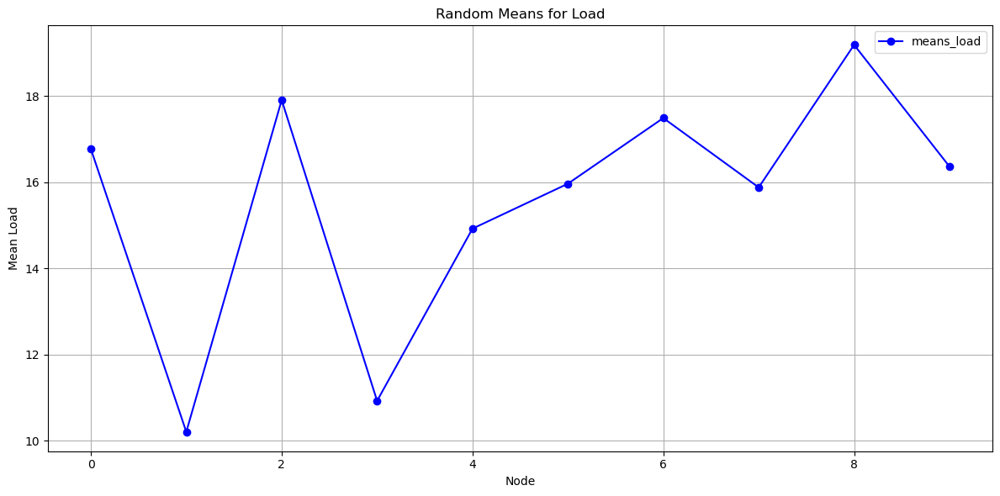

In [10]:
N = 10
T = 1000
mean_load = 15
var_load = 10
thetas = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
epsilons = [0.01, 0.1, 0.2, 0.5, 0.8]
k_values = [1, 2, 5]

means_load = generate_means(N, mean_load, var_load)

# Generate IID data
load_iid, load_iid_means = generate_iid_data(N, T, means_load)

# Generate AR(1) data
# load_ar1, load_ar1_means = generate_ar1_data(N, T, means_load, theta)
load_ar1_thetas = []
load_ar1_means_thetas = []
for theta in thetas:
    load_ar1_theta, load_ar1_means_theta = generate_ar1_data(N, T, means_load, theta)
    load_ar1_thetas.append(load_ar1_theta)
    load_ar1_means_thetas.append(load_ar1_means_theta)

In [282]:
# def plot_distributions(data, title):
#     plt.figure(figsize=(12, 6))
# 
#     for i in range(data.shape[0]):
#         # 计Calculate the mean and std for each row of data
#         mean = np.mean(data[i])
#         std = np.std(data[i])
# 
#         # Generate curves that conform to a normal distribution
#         x = np.linspace(mean - 3*std, mean + 3*std, 100)
#         p = norm.pdf(x, mean, std)
# 
#         # Plotting a normal distribution curve
#         plt.plot(x, p, label=f'Node {i+1}')
# 
#     plt.title(title)
#     plt.xlabel('Value')
#     plt.ylabel('Density')
#     plt.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()
# 
# plot_distributions(load_iid, 'IID Load Distribution')
# for i, theta in enumerate(thetas):
#     plot_distributions(load_ar1_thetas[i], f'AR(1) Load Distribution (Theta = {theta})')

In [283]:
# def plot_time_series(data, title):
#     plt.figure(figsize=(12, 6))
#     time = np.arange(data.shape[1])
# 
#     for i in range(data.shape[0]):
#         # Smoothing data using Savitzky-Golay filters
#         smoothed_data = savgol_filter(data[i], window_length=51, polyorder=3)
# 
#         # Plotting smoothed time series data
#         plt.plot(time, smoothed_data, label=f'Node {i+1}')
# 
#     plt.title(title)
#     plt.xlabel('Time (T)')
#     plt.ylabel('Value')
#     plt.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()
# 
# plot_time_series(load_iid, 'IID Load Time Series')
# for i, theta in enumerate(thetas):
#     plot_time_series(load_ar1_thetas[i], f'AR(1) Load Time Series (Theta = {theta})')


In [11]:
def plot_combined(data, title):
    fig, axs = plt.subplots(1, 2, figsize=(18, 6))
    time = np.arange(data.shape[1])

    # Plot distributions (left subplot)
    for i in range(data.shape[0]):
        mean = np.mean(data[i])
        std = np.std(data[i])
        x = np.linspace(mean - 3 * std, mean + 3 * std, 100)
        p = norm.pdf(x, mean, std)
        axs[0].plot(x, p, label=f'Node {i + 1}')
    axs[0].set_title(f'{title} - Distribution')
    axs[0].set_xlabel('Value')
    axs[0].set_ylabel('Density')
    axs[0].legend()
    axs[0].grid(True)

    def exponential_moving_average(data, alpha):
        ema = np.zeros_like(data)
        ema[0] = data[0]
        for t in range(1, len(data)):
            ema[t] = alpha * data[t] + (1 - alpha) * ema[t - 1]
        return ema

    # Plot smoothed time series (right subplot)
    for i in range(data.shape[0]):
        smoothed_data = savgol_filter(data[i], window_length=51, polyorder=3)
        axs[1].plot(time, smoothed_data, label=f'Node {i + 1}')
    axs[1].set_title(f'{title} - Time Series')
    axs[1].set_xlabel('Time (T)')
    axs[1].set_ylabel('Value')
    axs[1].legend()
    axs[1].grid(True)

    plt.tight_layout()
    fig.savefig(f'image/{title}.png')
    plt.show()

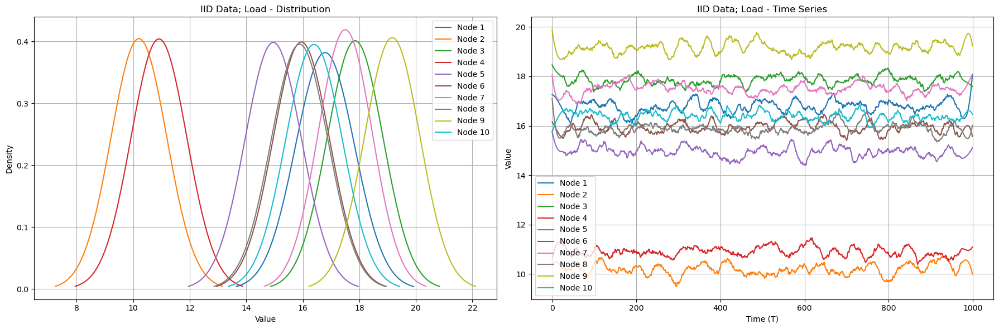

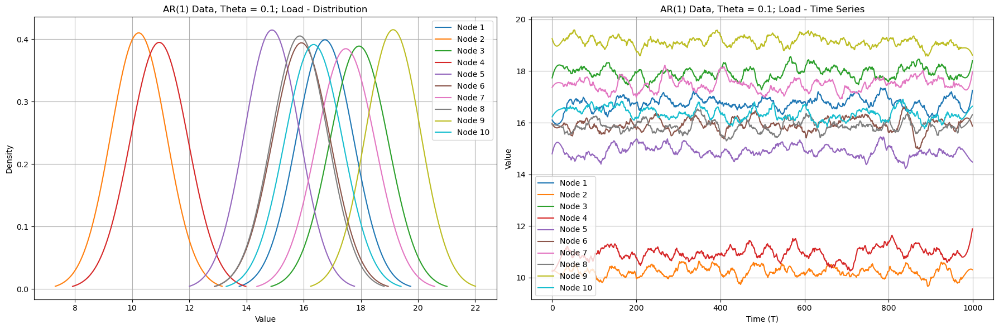

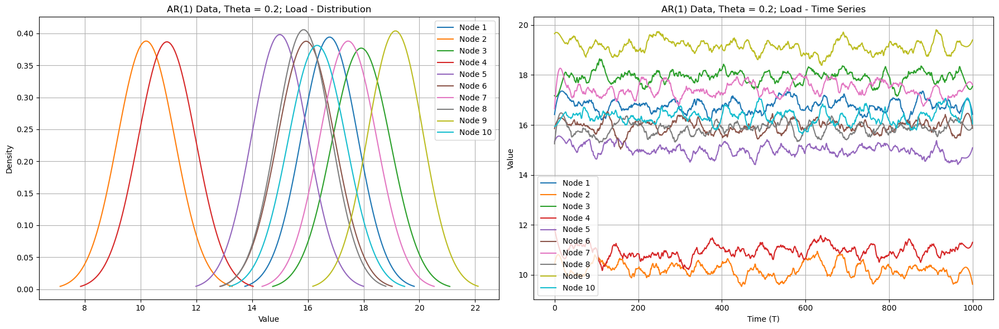

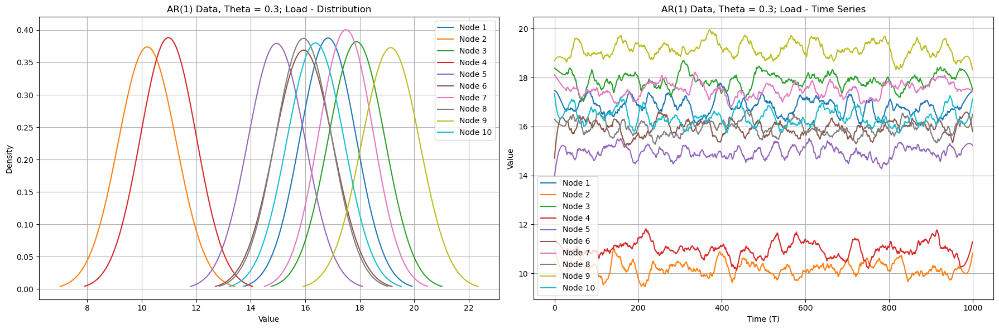

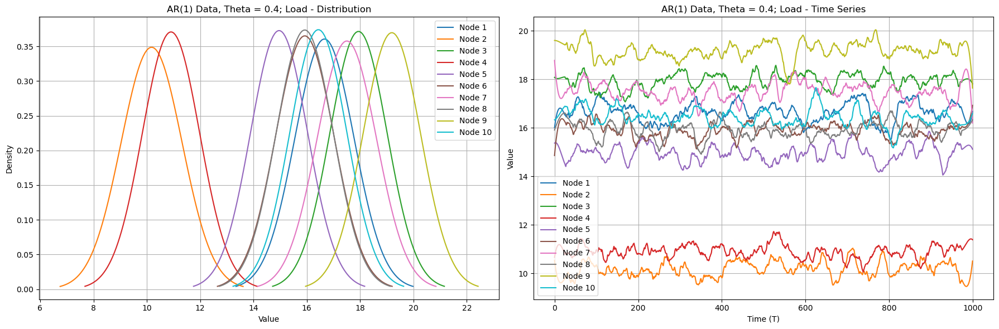

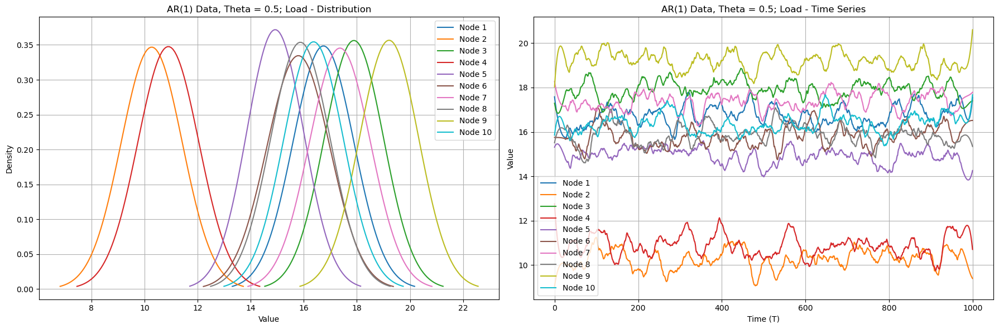

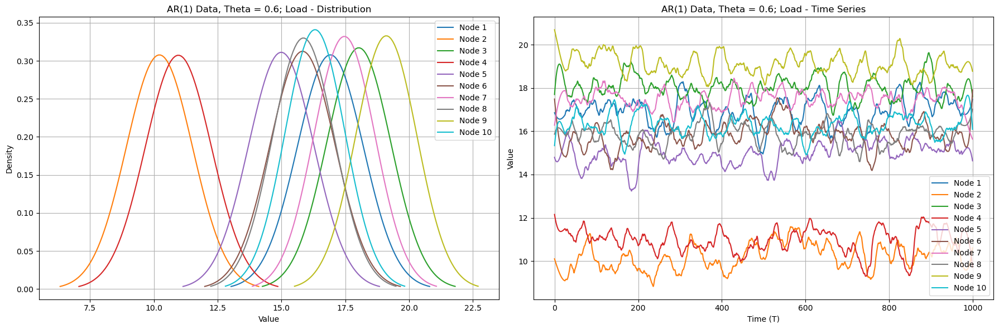

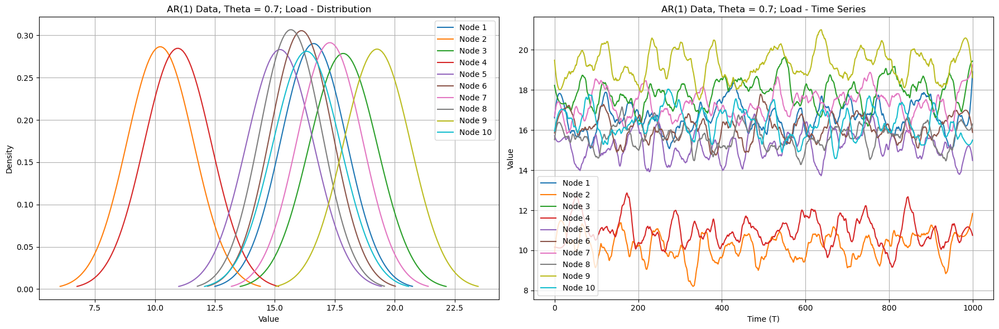

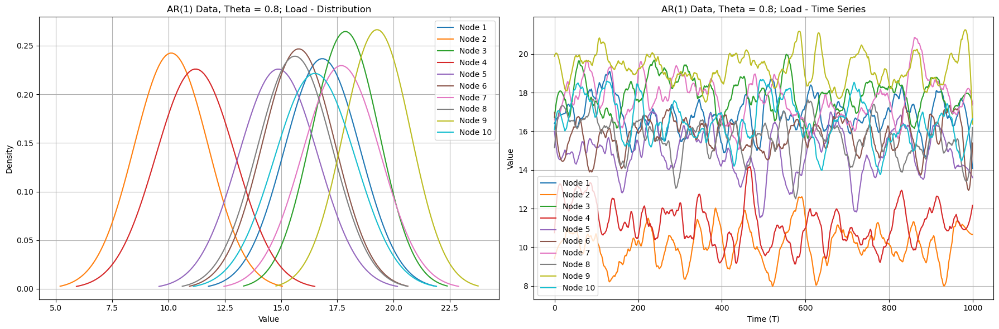

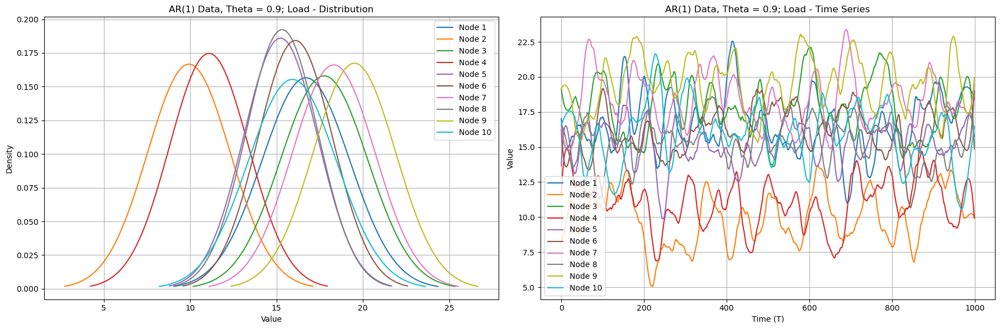

In [12]:
plot_combined(load_iid, 'IID Data; Load')
for i, theta in enumerate(thetas):
    plot_combined(load_ar1_thetas[i], f'AR(1) Data, Theta = {theta}; Load')

# Implementation epsilon greedy algorithm

In [13]:
# Epsilon-greedy algorithm
def epsilon_greedy(loads, loads_means, epsilons):
    N = len(loads)
    T = len(loads[0])

    optimal_mean_load = np.min(loads_means)
    optimal_reward = 1 / (1 + optimal_mean_load)

    # print('Optimal Mean Load:', optimal_mean_load, '; Optimal Reward:', optimal_reward)

    all_regrets = []
    all_actions = []
    all_accuracies = []

    for epsilon in epsilons:
        rewards = np.zeros(N)
        counts = np.zeros(N)
        regrets = []
        actions = []

        for t in range(T):
            if np.random.rand() < epsilon:
                action = np.random.randint(N)  # Explore
            else:
                action = np.argmax(rewards)  # Exploit

            load = loads[action][t]
            reward = 1 / (1 + load)
            # print('ε:', epsilon, '; T:', t, '; Action:', action, '; load:', load, '; Reward:', reward)

            counts[action] += 1
            n = counts[action]
            value = rewards[action]
            rewards[action] = ((n - 1) / n) * value + (1 / n) * reward

            regret = optimal_reward - reward
            regrets.append(regret)
            actions.append(action)

        all_regrets.append(regrets)
        all_actions.append(actions)

        accuracies = {k: calculate_top_k_accuracy(actions, loads_means, k) for k in k_values}
        all_accuracies.append(accuracies)

    return all_regrets, all_actions, all_accuracies

In [33]:
def calculate_top_k_accuracy(actions, load_means, k):
    optimal_actions = np.argsort(load_means)[:-k]  #TODO ？ 用count来计算
    accuracies = np.zeros(T)

    for t in range(T):
        if actions[t] in optimal_actions:
            accuracies[t] = 1

    top_k_accuracy = accuracies.sum() / T

    return top_k_accuracy

In [34]:
# plot smoothed single-step regrets
def plot_smoothed_single_regrets_savgol(ax, all_regrets, epsilons):
    for i, epsilon in enumerate(epsilons):
        regrets = all_regrets[i]
        smoothed_single_step_regrets = savgol_filter(regrets, window_length=51, polyorder=3)
        ax.plot(smoothed_single_step_regrets, label=f'Epsilon {epsilon}')

    ax.set_xlabel('Time Steps')
    ax.set_ylabel('Smoothed Single-Step Regret')
    ax.set_title('Epsilon-Greedy Algorithm: Smoothed Single-Step Regret Over Time')
    ax.legend()
    ax.grid(True)

In [35]:
# find the convergence step
def find_convergence_step(smoothed_regrets, threshold=0.01):
    for i in range(1, len(smoothed_regrets)):
        if abs(smoothed_regrets[i] - smoothed_regrets[i-1]) < threshold:
            return i
    return len(smoothed_regrets)  # if no convergence point is found, return the maximum number of steps

In [36]:
def plot_smoothed_cumulative_regrets_savgol(ax, all_regrets, epsilons, threshold=0.01):
    colors = plt.colormaps.get_cmap('jet')(np.linspace(0, 1, len(epsilons)))
    
    convergence_steps = []
    for i, epsilon in enumerate(epsilons):
        regrets = all_regrets[i]
        smoothed_cumulative_regrets = savgol_filter(np.cumsum(regrets), window_length=51, polyorder=3)
        convergence_step = find_convergence_step(smoothed_cumulative_regrets, threshold)

        color = colors[i]
        ax.plot(smoothed_cumulative_regrets, label=f'Epsilon {epsilon}', color=color)
        ax.axvline(convergence_step, color=color, linestyle='--', label=f'Convergence Step for ε={epsilon}, step: {convergence_step}')
        ax.text(convergence_step, smoothed_cumulative_regrets[convergence_step-1], f'{convergence_step}', color=color,
                verticalalignment='bottom', horizontalalignment='right')
        
        # print(f'epsilon:{epsilon}, convergence step: {convergence_step}')
        convergence_steps.append(convergence_step)
        

    ax.set_xlabel('Time Steps')
    ax.set_ylabel('Smoothed Cumulative Regret')
    ax.set_title('Epsilon-Greedy Algorithm: Smoothed Cumulative Regret Over Time')
    ax.legend()
    ax.grid(True)
    
    return convergence_steps

In [37]:
def plot_top_k_accuracy(ax, accuracies_list, epsilons, k_values):
    width = 0.15  # length of the bar
    x = np.arange(len(k_values))  # top_k locations

    for i, epsilon in enumerate(epsilons):
        top_k_accuracies = [accuracies_list[i][k] for k in k_values]
        ax.bar(x + i * width, top_k_accuracies, width, label=f'Epsilon = {epsilon}')

    ax.set_xlabel('Top-k')
    ax.set_ylabel('Accuracy')
    ax.set_title('Top-k Accuracy for Different Epsilons')
    ax.set_xticks(x + width * (len(epsilons) - 1) / 2)
    ax.set_xticklabels(k_values)
    ax.legend()
    ax.grid(True)

In [38]:
def plot_epsilon_greedy_results(regrets, accuracies, epsilons, k_values, savename='result', threshold=0.01):
    # Create a figure with three subplots
    fig, axs = plt.subplots(1, 3, figsize=(20, 6))
    
    # Plot single-step regrets
    plot_smoothed_single_regrets_savgol(axs[0], regrets, epsilons)
    
    # Plot cumulative regrets
    convergence_steps = plot_smoothed_cumulative_regrets_savgol(axs[1], regrets, epsilons, threshold=threshold)

    # Plot the third subplot (Top-k accuracy)
    plot_top_k_accuracy(axs[2], accuracies, epsilons, k_values)

    # set title
    fig.suptitle(savename, fontsize=16)

    plt.tight_layout()

    fig.savefig(f'image/{savename}.png')

    plt.show()
    
    for i, epsilon in enumerate(epsilons):
        print(f'epsilon: {epsilon: <6} | convergence step: {convergence_steps[i]: <5} | '
              f'top-1: {accuracies[i][1]: <5} | top-2: {accuracies[i][2]: <5} | top-5: {accuracies[i][5]: <5}')
    
    return convergence_steps

In [39]:
def plot_actions(ax, actions, title, convergence_step):
    # Plot the nodes selected at each iteration over 1000 iterations
    time = np.arange(len(actions))

    ax.plot(time, actions)
    ax.axvline(convergence_step, linestyle='--', color='red')

    ax.set_title(title)
    ax.set_xlabel('Time (T)')
    ax.set_ylabel('Node')
    ax.grid(True)

In [40]:
def plot_all_actions(epsilons, actions, convergence_steps, savename):
    fig, axs = plt.subplots(len(epsilons), 1, figsize=(12, len(epsilons) * 4))
    
    for i, ax in enumerate(axs):
        plot_actions(ax, actions[i], f'{savename}; epsilon={epsilons[i]}', convergence_steps[i])
    
    plt.tight_layout()
    fig.savefig(f'image/{savename}.png')
    plt.show()

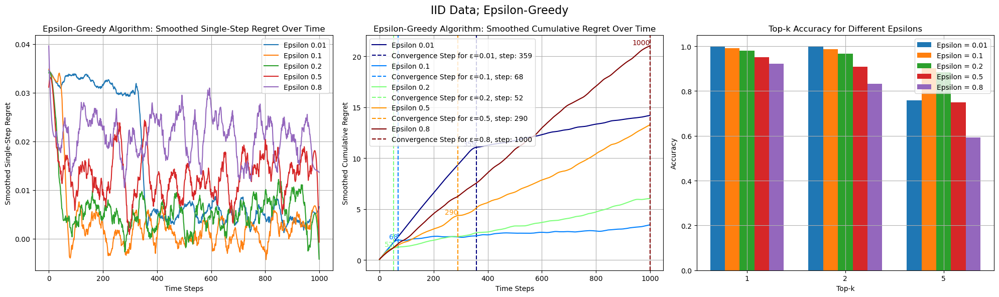

epsilon: 0.01   | convergence step: 359   | top-1: 0.999 | top-2: 0.998 | top-5: 0.758
epsilon: 0.1    | convergence step: 68    | top-1: 0.992 | top-2: 0.986 | top-5: 0.902
epsilon: 0.2    | convergence step: 52    | top-1: 0.981 | top-2: 0.967 | top-5: 0.884
epsilon: 0.5    | convergence step: 290   | top-1: 0.951 | top-2: 0.908 | top-5: 0.749
epsilon: 0.8    | convergence step: 1000  | top-1: 0.922 | top-2: 0.832 | top-5: 0.592


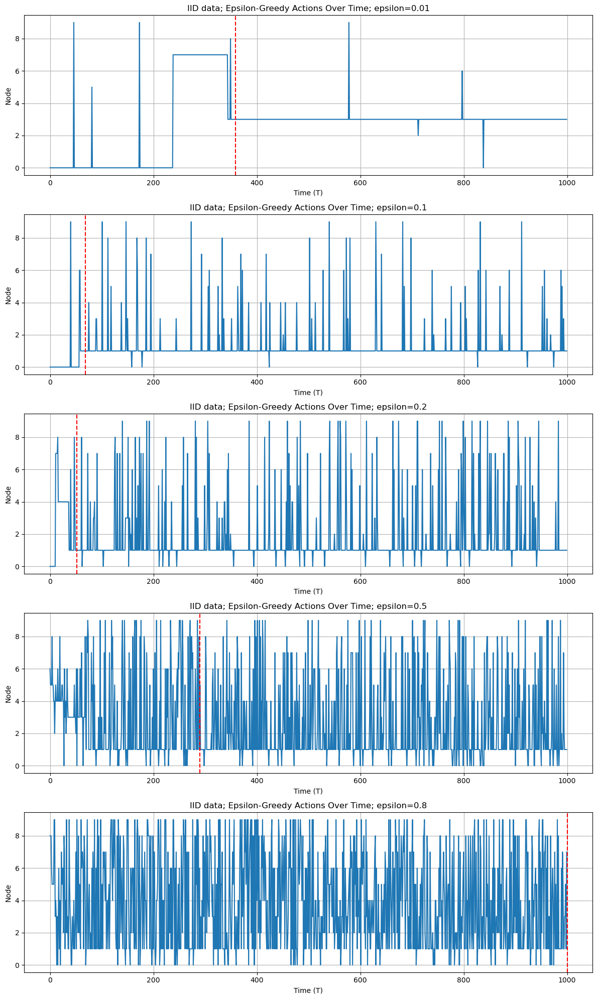

In [42]:
iid_regrets, iid_actions, iid_accuracies = epsilon_greedy(load_iid, load_iid_means, epsilons)
iid_convergence_steps = plot_epsilon_greedy_results(iid_regrets, iid_accuracies, epsilons, k_values, 'IID Data; Epsilon-Greedy', threshold=0.005)
plot_all_actions(epsilons, iid_actions, iid_convergence_steps, 'IID data; Epsilon-Greedy Actions Over Time')

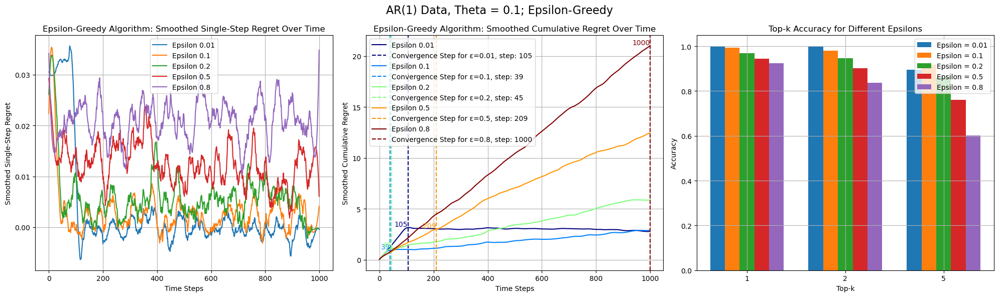

epsilon: 0.01   | convergence step: 105   | top-1: 0.999 | top-2: 0.999 | top-5: 0.896
epsilon: 0.1    | convergence step: 39    | top-1: 0.994 | top-2: 0.981 | top-5: 0.917
epsilon: 0.2    | convergence step: 45    | top-1: 0.969 | top-2: 0.946 | top-5: 0.862
epsilon: 0.5    | convergence step: 209   | top-1: 0.945 | top-2: 0.901 | top-5: 0.76 
epsilon: 0.8    | convergence step: 1000  | top-1: 0.924 | top-2: 0.836 | top-5: 0.601


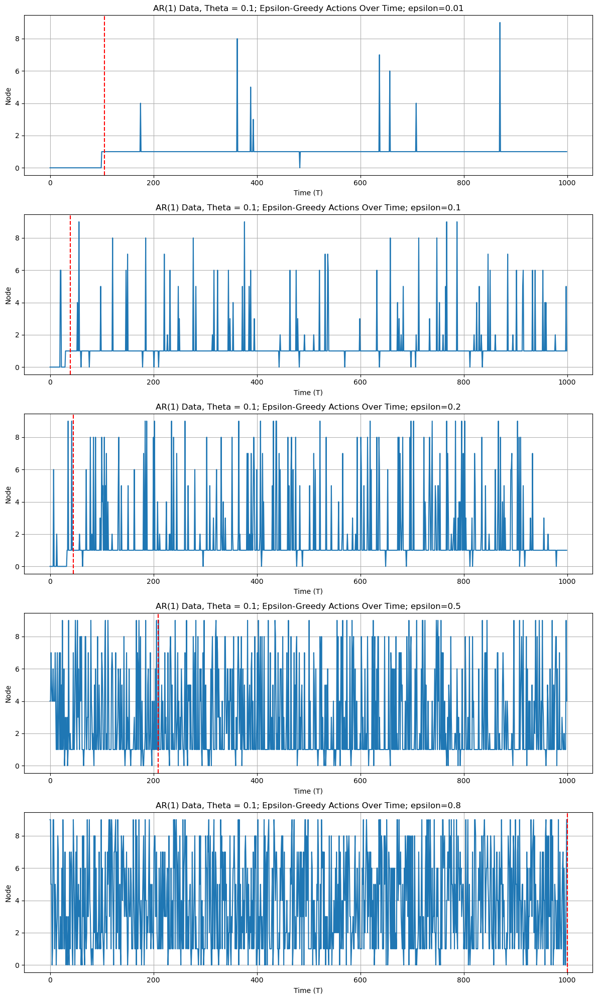

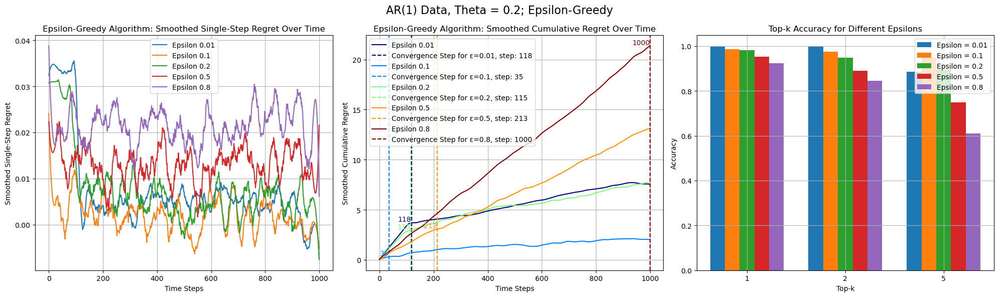

epsilon: 0.01   | convergence step: 118   | top-1: 0.998 | top-2: 0.997 | top-5: 0.886
epsilon: 0.1    | convergence step: 35    | top-1: 0.985 | top-2: 0.974 | top-5: 0.948
epsilon: 0.2    | convergence step: 115   | top-1: 0.981 | top-2: 0.947 | top-5: 0.895
epsilon: 0.5    | convergence step: 213   | top-1: 0.953 | top-2: 0.89  | top-5: 0.749
epsilon: 0.8    | convergence step: 1000  | top-1: 0.923 | top-2: 0.846 | top-5: 0.611


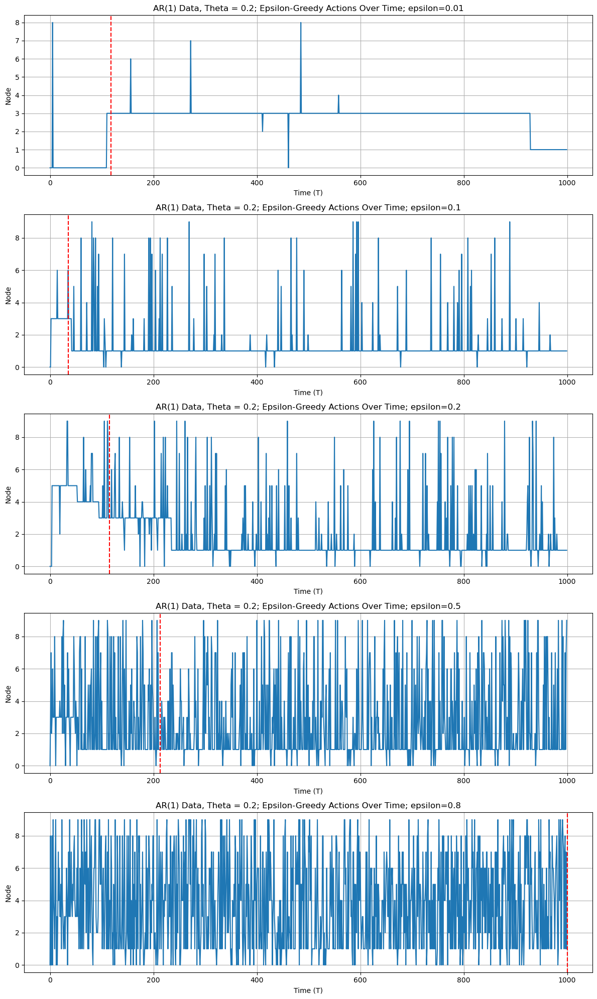

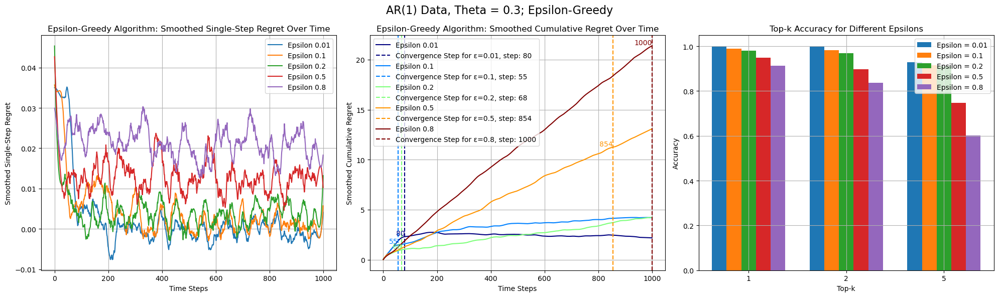

epsilon: 0.01   | convergence step: 80    | top-1: 0.999 | top-2: 0.999 | top-5: 0.928
epsilon: 0.1    | convergence step: 55    | top-1: 0.989 | top-2: 0.982 | top-5: 0.916
epsilon: 0.2    | convergence step: 68    | top-1: 0.981 | top-2: 0.97  | top-5: 0.91 
epsilon: 0.5    | convergence step: 854   | top-1: 0.949 | top-2: 0.897 | top-5: 0.748
epsilon: 0.8    | convergence step: 1000  | top-1: 0.912 | top-2: 0.837 | top-5: 0.602


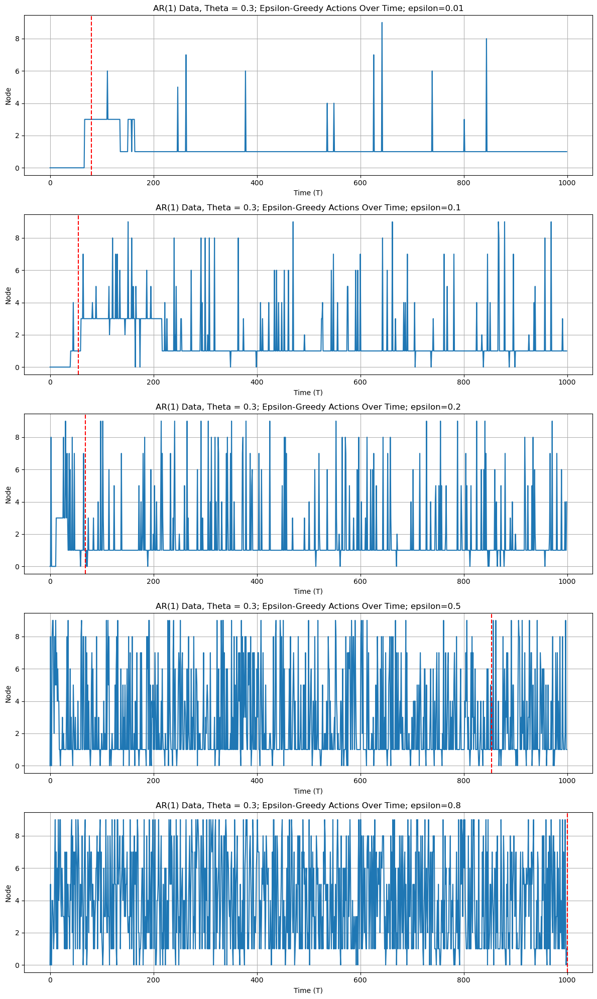

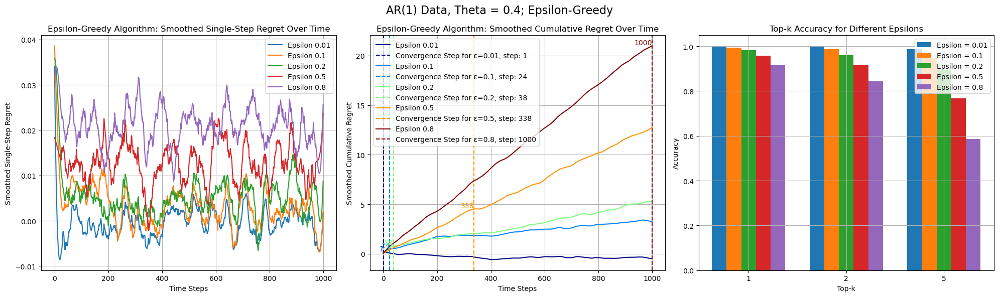

epsilon: 0.01   | convergence step: 1     | top-1: 0.999 | top-2: 0.998 | top-5: 0.988
epsilon: 0.1    | convergence step: 24    | top-1: 0.993 | top-2: 0.986 | top-5: 0.946
epsilon: 0.2    | convergence step: 38    | top-1: 0.982 | top-2: 0.96  | top-5: 0.893
epsilon: 0.5    | convergence step: 338   | top-1: 0.957 | top-2: 0.916 | top-5: 0.767
epsilon: 0.8    | convergence step: 1000  | top-1: 0.915 | top-2: 0.843 | top-5: 0.587


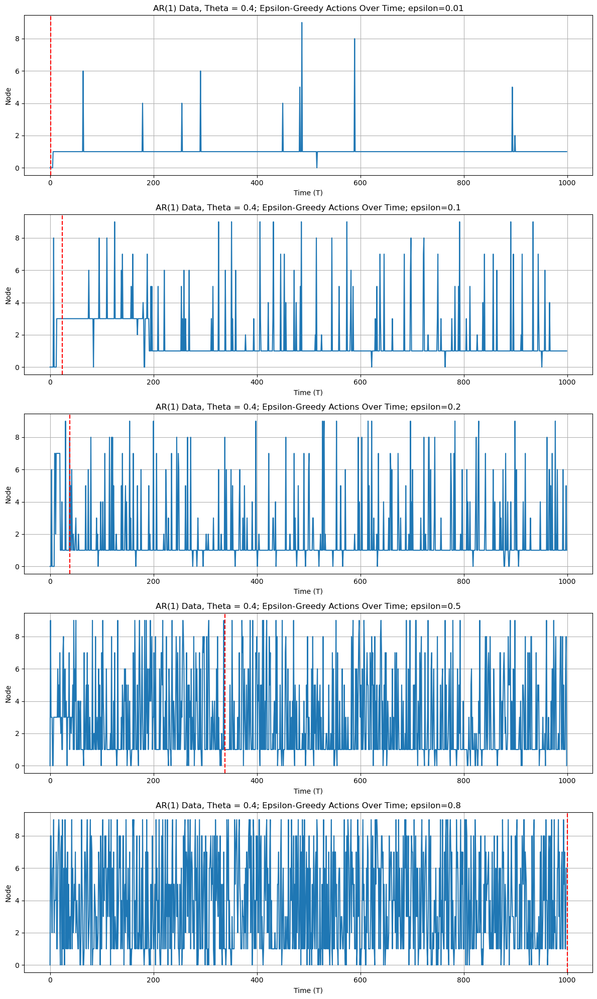

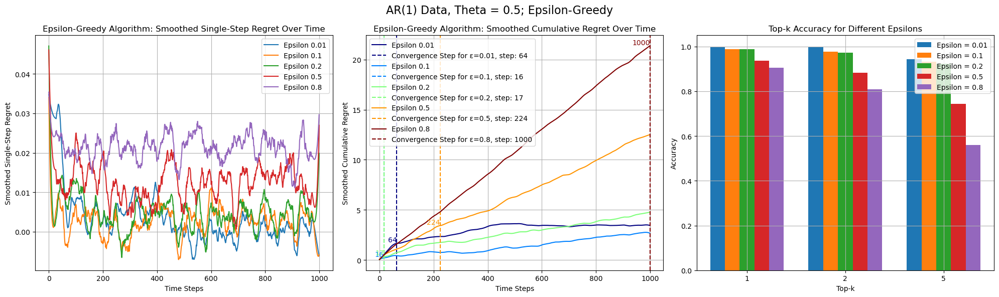

epsilon: 0.01   | convergence step: 64    | top-1: 1.0   | top-2: 1.0   | top-5: 0.944
epsilon: 0.1    | convergence step: 16    | top-1: 0.988 | top-2: 0.976 | top-5: 0.932
epsilon: 0.2    | convergence step: 17    | top-1: 0.989 | top-2: 0.973 | top-5: 0.923
epsilon: 0.5    | convergence step: 224   | top-1: 0.937 | top-2: 0.882 | top-5: 0.744
epsilon: 0.8    | convergence step: 1000  | top-1: 0.904 | top-2: 0.809 | top-5: 0.559


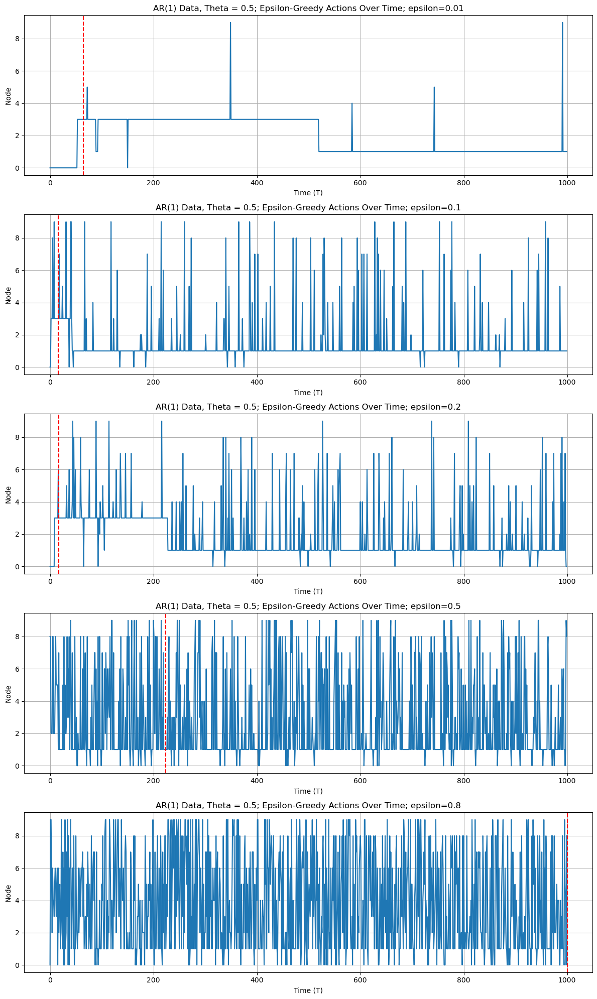

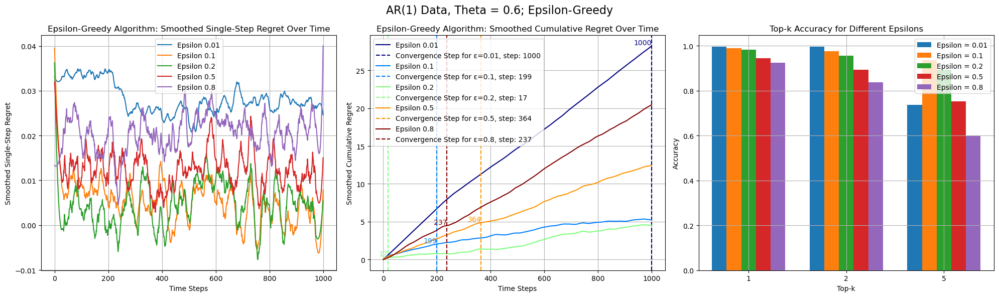

epsilon: 0.01   | convergence step: 1000  | top-1: 0.997 | top-2: 0.997 | top-5: 0.737
epsilon: 0.1    | convergence step: 199   | top-1: 0.989 | top-2: 0.976 | top-5: 0.935
epsilon: 0.2    | convergence step: 17    | top-1: 0.982 | top-2: 0.956 | top-5: 0.894
epsilon: 0.5    | convergence step: 364   | top-1: 0.945 | top-2: 0.894 | top-5: 0.753
epsilon: 0.8    | convergence step: 237   | top-1: 0.925 | top-2: 0.837 | top-5: 0.601


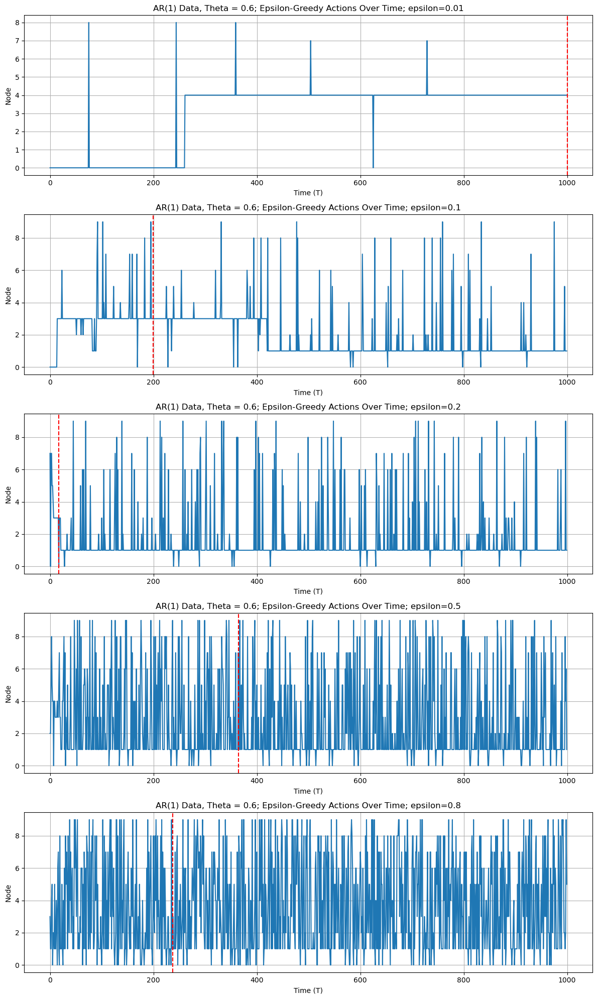

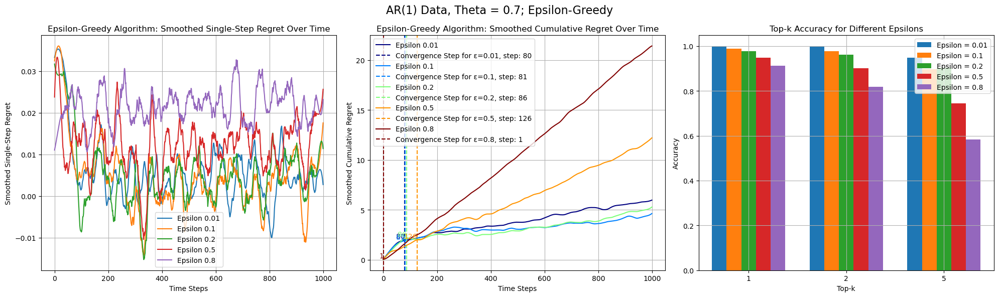

epsilon: 0.01   | convergence step: 80    | top-1: 0.998 | top-2: 0.997 | top-5: 0.948
epsilon: 0.1    | convergence step: 81    | top-1: 0.988 | top-2: 0.976 | top-5: 0.897
epsilon: 0.2    | convergence step: 86    | top-1: 0.976 | top-2: 0.962 | top-5: 0.903
epsilon: 0.5    | convergence step: 126   | top-1: 0.947 | top-2: 0.9   | top-5: 0.745
epsilon: 0.8    | convergence step: 1     | top-1: 0.913 | top-2: 0.819 | top-5: 0.584


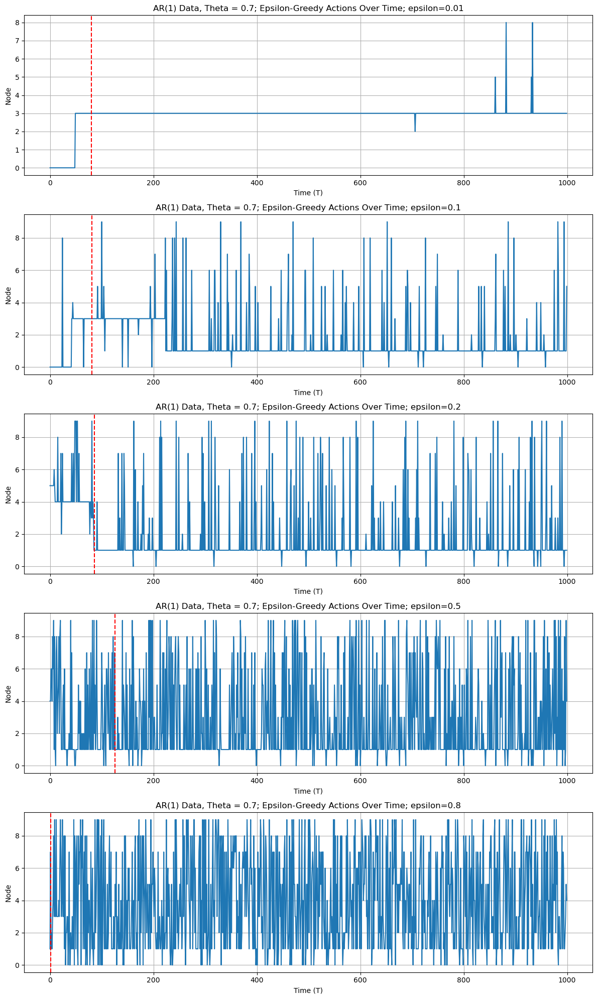

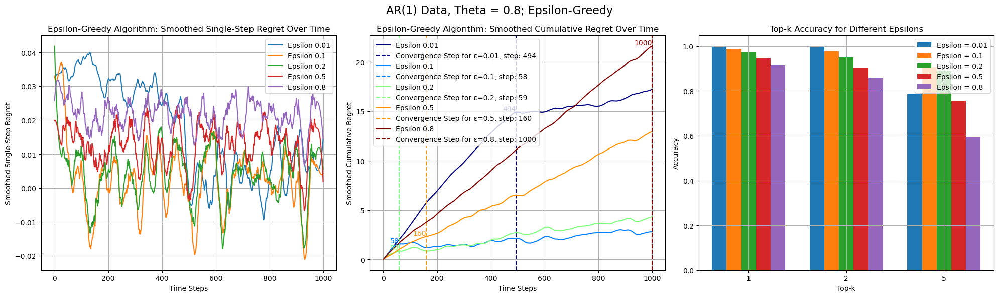

epsilon: 0.01   | convergence step: 494   | top-1: 0.998 | top-2: 0.997 | top-5: 0.785
epsilon: 0.1    | convergence step: 58    | top-1: 0.989 | top-2: 0.979 | top-5: 0.906
epsilon: 0.2    | convergence step: 59    | top-1: 0.973 | top-2: 0.951 | top-5: 0.889
epsilon: 0.5    | convergence step: 160   | top-1: 0.948 | top-2: 0.901 | top-5: 0.756
epsilon: 0.8    | convergence step: 1000  | top-1: 0.914 | top-2: 0.857 | top-5: 0.595


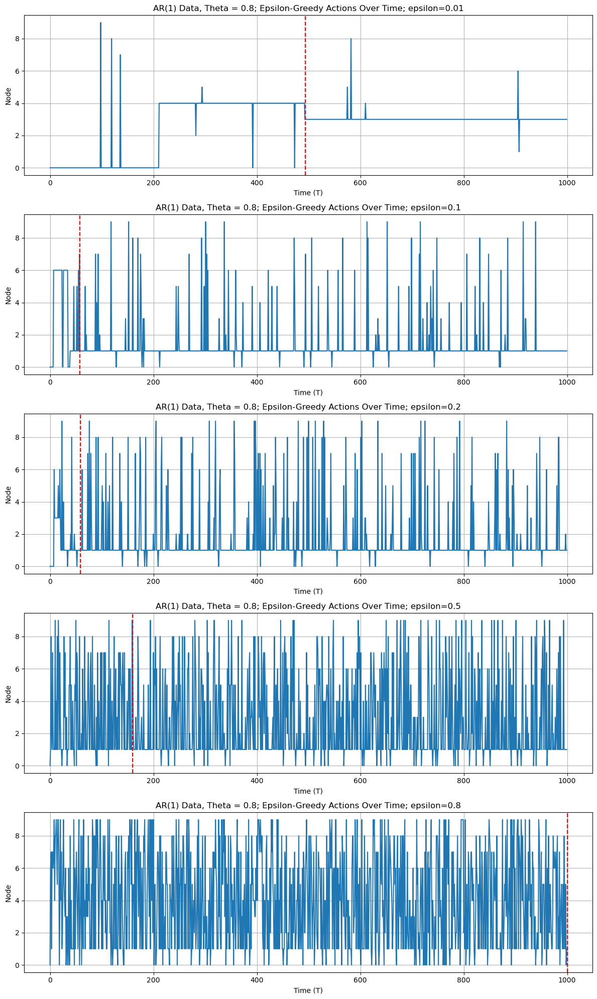

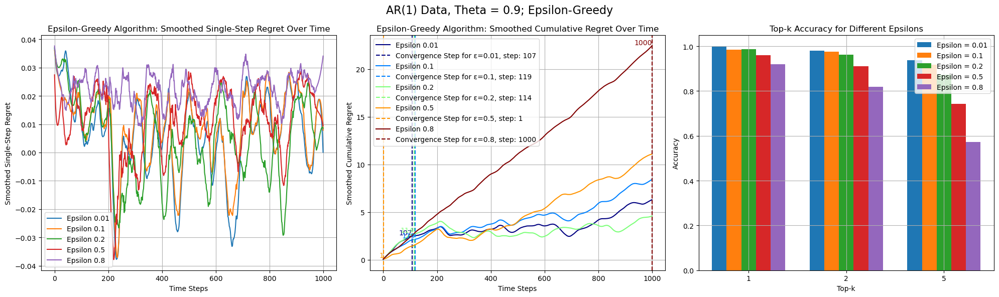

epsilon: 0.01   | convergence step: 107   | top-1: 0.999 | top-2: 0.981 | top-5: 0.937
epsilon: 0.1    | convergence step: 119   | top-1: 0.985 | top-2: 0.975 | top-5: 0.917
epsilon: 0.2    | convergence step: 114   | top-1: 0.987 | top-2: 0.962 | top-5: 0.873
epsilon: 0.5    | convergence step: 1     | top-1: 0.96  | top-2: 0.911 | top-5: 0.743
epsilon: 0.8    | convergence step: 1000  | top-1: 0.92  | top-2: 0.819 | top-5: 0.573


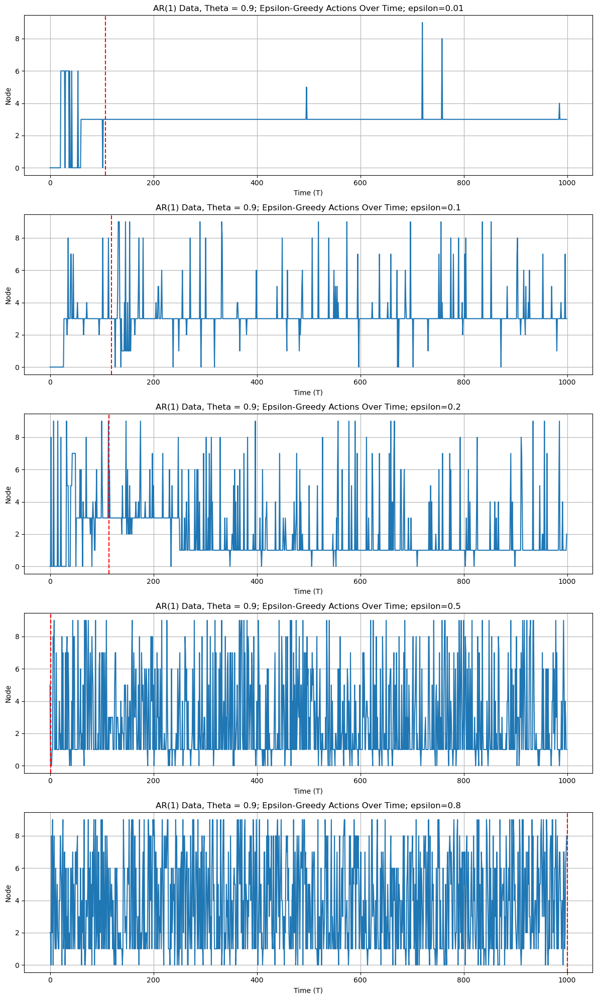

In [43]:
all_ar1_regrets = []
all_ar1_actions = []
all_ar1_accuracies = []
for i, theta in enumerate(thetas):
    ar1_regrets, ar1_actions, ar1_accuracies = epsilon_greedy(load_ar1_thetas[i], load_ar1_means_thetas[i], epsilons)
    ar1_convergence_steps = plot_epsilon_greedy_results(ar1_regrets, ar1_accuracies, epsilons, k_values,
                                f'AR(1) Data, Theta = {theta}; Epsilon-Greedy', threshold=0.005)
    plot_all_actions(epsilons, ar1_actions, ar1_convergence_steps, f'AR(1) Data, Theta = {theta}; Epsilon-Greedy Actions Over Time')

    all_ar1_regrets.append(ar1_regrets)
    all_ar1_actions.append(ar1_actions)
    all_ar1_accuracies.append(ar1_accuracies)


# UCB

In [44]:
def ucb(loads, loads_means, alpha):
    N = len(loads)
    T = len(loads[0])

    optimal_mean_load = np.min(loads_means)
    optimal_reward = 1 / (1 + optimal_mean_load)

    # print('Optimal Mean Load:', optimal_mean_load, '; Optimal Reward:', optimal_reward)

    rewards = np.zeros(N)
    counts = np.zeros(N)
    ucbs = np.zeros(N)
    regrets = []
    actions = []

    for t in range(T):
        # print('T:', t)
        for i in range(N):
            if counts[i] == 0:
                ucbs[i] = np.inf
            else:
                ucbs[i] = rewards[i] + np.sqrt(alpha * np.log(t + 1) / counts[i])
                # print('i:', i, '; UCB:', ucbs[i], '= rewards:', rewards[i], '+', np.sqrt(2 * np.log(t + 1) / counts[i]))

        action = np.argmax(ucbs)

        load = loads[action][t]
        reward = 1 / (1 + load)
        # print('T:', t, '; Action:', action, '; load:', load, '; Reward:', reward)
        # print('ucbs:', ucbs)
        # print('rewards:', rewards)

        counts[action] += 1
        n = counts[action]
        value = rewards[action]
        rewards[action] = ((n - 1) / n) * value + (1 / n) * reward

        regret = optimal_reward - reward
        regrets.append(regret)
        actions.append(action)

    accuracies = {k: calculate_top_k_accuracy(actions, loads_means, k) for k in k_values}

    return regrets, actions, accuracies


In [45]:
def plot_ucb_combined_results(regrets, actions, accuracies, k_values, alpha, savename='UCB Results', threshold=0.01, theta=None):
    fig, axs = plt.subplots(2, 2, figsize=(18, 12))

    # Plot smoothed single-step regrets
    smoothed_single_step_regrets = savgol_filter(regrets, window_length=51, polyorder=3)
    axs[0, 0].plot(smoothed_single_step_regrets)
    axs[0, 0].set_xlabel('Time Steps')
    axs[0, 0].set_ylabel('Smoothed Single-Step Regret')
    axs[0, 0].set_title('Single-Step Regret')
    axs[0, 0].grid(True)

    # Plot smoothed cumulative regrets
    smoothed_cumulative_regrets = savgol_filter(np.cumsum(regrets), window_length=51, polyorder=3)
    convergence_step = find_convergence_step(smoothed_cumulative_regrets, threshold)
    axs[0, 1].plot(smoothed_cumulative_regrets)
    axs[0, 1].axvline(convergence_step, color='red', linestyle='--', label=f'Convergence Step: {convergence_step}')
    axs[0, 1].text(convergence_step, smoothed_cumulative_regrets[convergence_step-1], f'{convergence_step}', color='red',
                   verticalalignment='bottom', horizontalalignment='right')
    axs[0, 1].set_xlabel('Time Steps')
    axs[0, 1].set_ylabel('Smoothed Cumulative Regret')
    axs[0, 1].set_title('Smoothed Cumulative Regret')
    axs[0, 1].grid(True)

    # Plot top-k accuracy
    width = 0.15
    x = np.arange(len(k_values))
    top_k_accuracies = [accuracies[k] for k in k_values]
    axs[1, 0].bar(x, top_k_accuracies, width)
    axs[1, 0].set_xticks(x)
    axs[1, 0].set_xticklabels(k_values)
    axs[1, 0].set_xlabel('Top-k')
    axs[1, 0].set_ylabel('Accuracy')
    axs[1, 0].set_title('Top-k Accuracy')
    axs[1, 0].grid(True)

    # Plot actions
    time = np.arange(len(actions))
    axs[1, 1].plot(time, actions)
    axs[1, 1].axvline(convergence_step, linestyle='--', color='red')
    axs[1, 1].set_title('Action Plot')
    axs[1, 1].set_xlabel('Time (T)')
    axs[1, 1].set_ylabel('Node')
    axs[1, 1].grid(True)

    fig.suptitle(savename, fontsize=16)
    plt.tight_layout()
    plt.subplots_adjust(top=0.9)
    plt.savefig(f'image/{savename}.png')
    plt.show()

    # if not theta:
    #     print(f'alpha: {alpha: <5} | Convergence step: {convergence_step: <4} | top-1: {accuracies[1]: <5} | top-2: {accuracies[2]: <5} | top-5: {accuracies[5]: <5}')
    # else:
    #     print(f'theta: {theta: <3} | alpha: {alpha: <5} | Convergence step: {convergence_step: <4} | top-1: {accuracies[1]: <5} | top-2: {accuracies[2]: <5} | top-5: {accuracies[5]: <5}')
    return convergence_step

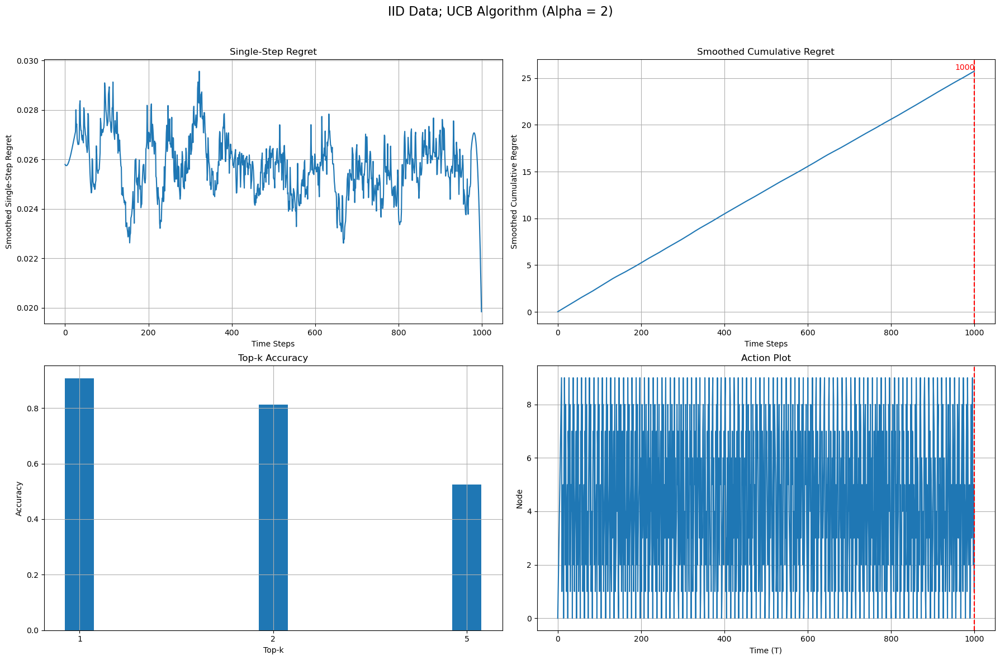

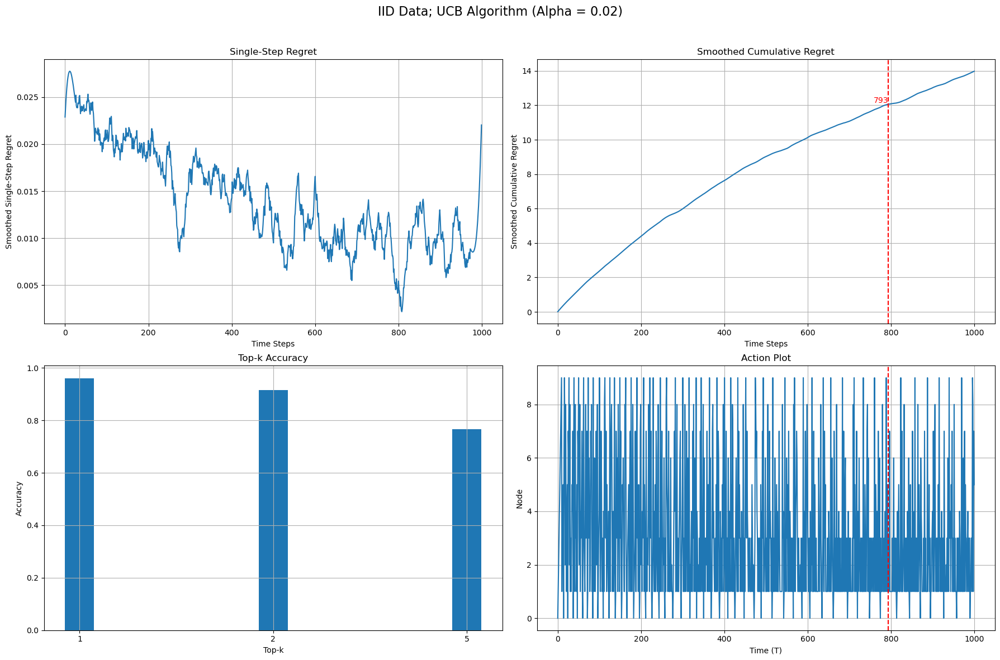

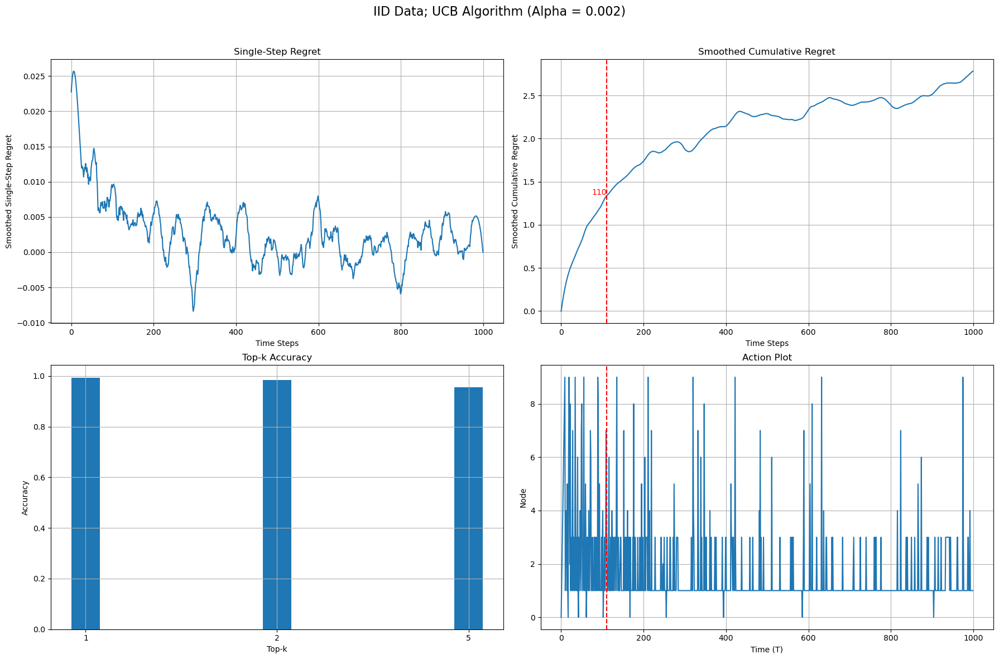

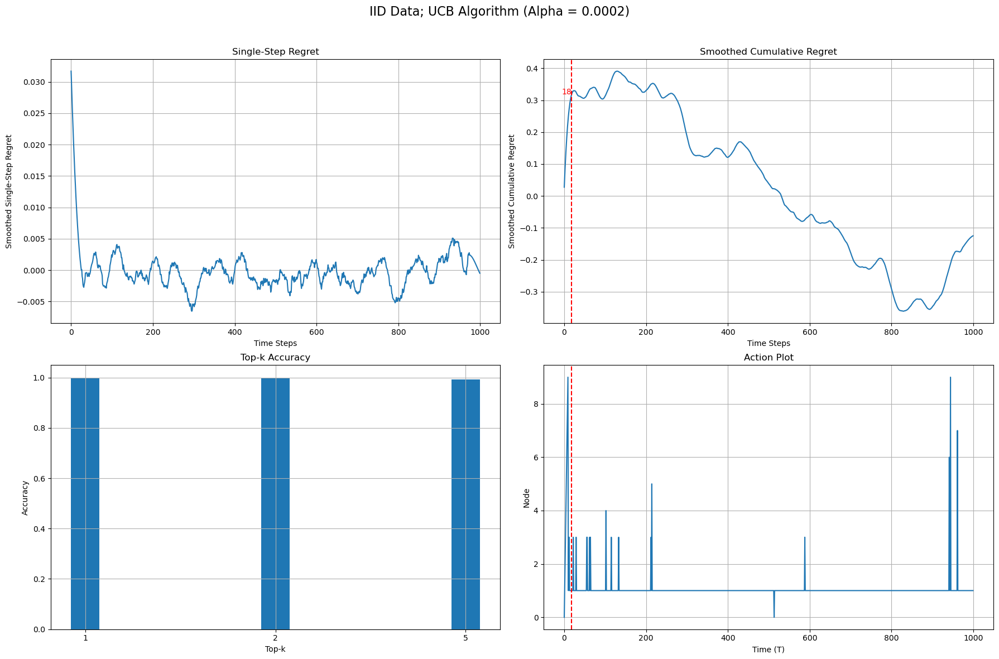

In [46]:
for alpha in [2, 0.02, 0.002, 0.0002]:
    iid_ucb_regrets, iid_ucb_actions, iid_ucb_accuracies = ucb(load_iid, load_iid_means, alpha)
    iid_ucb_convergence_steps = plot_ucb_combined_results(iid_ucb_regrets, iid_ucb_actions, iid_ucb_accuracies, k_values, alpha, f'IID Data; UCB Algorithm (Alpha = {alpha})', threshold=0.005)

In [47]:
for i, theta in enumerate(thetas):
    for alpha in [0.01, 0.02, 0.05, 0.08]:
        ar1_ucb_regrets, ar1_ucb_actions, ar1_ucb_accuracies = ucb(load_ar1_thetas[i], load_ar1_means_thetas[i], alpha)
        # ar1_ucb_convergence_steps = plot_ucb_combined_results(ar1_ucb_regrets, ar1_ucb_actions, ar1_ucb_accuracies, k_values, alpha, f'AR(1) Data, Theta = {theta}; UCB Algorithm (Alpha = {alpha})', 0.005, theta)
        print(f'theta: {theta: <3} | alpha: {alpha: <5} | top-1: {ar1_ucb_accuracies[1]: <5} | top-2: {ar1_ucb_accuracies[2]: <5} | top-5: {ar1_ucb_accuracies[5]: <5}')
        

theta: 0.1 | alpha: 0.01  | top-1: 0.974 | top-2: 0.943 | top-5: 0.843
theta: 0.1 | alpha: 0.02  | top-1: 0.96  | top-2: 0.915 | top-5: 0.768
theta: 0.1 | alpha: 0.05  | top-1: 0.941 | top-2: 0.877 | top-5: 0.67 
theta: 0.1 | alpha: 0.08  | top-1: 0.933 | top-2: 0.862 | top-5: 0.633
theta: 0.2 | alpha: 0.01  | top-1: 0.975 | top-2: 0.946 | top-5: 0.846
theta: 0.2 | alpha: 0.02  | top-1: 0.961 | top-2: 0.918 | top-5: 0.771
theta: 0.2 | alpha: 0.05  | top-1: 0.943 | top-2: 0.88  | top-5: 0.673
theta: 0.2 | alpha: 0.08  | top-1: 0.935 | top-2: 0.864 | top-5: 0.635
theta: 0.3 | alpha: 0.01  | top-1: 0.975 | top-2: 0.947 | top-5: 0.849
theta: 0.3 | alpha: 0.02  | top-1: 0.961 | top-2: 0.917 | top-5: 0.772
theta: 0.3 | alpha: 0.05  | top-1: 0.942 | top-2: 0.88  | top-5: 0.674
theta: 0.3 | alpha: 0.08  | top-1: 0.934 | top-2: 0.863 | top-5: 0.634
theta: 0.4 | alpha: 0.01  | top-1: 0.975 | top-2: 0.946 | top-5: 0.849
theta: 0.4 | alpha: 0.02  | top-1: 0.962 | top-2: 0.919 | top-5: 0.775
theta:

经过meeting后，建议将UCB算法中的alpha固定下来，经过对比，我选择令alpha=0.0002，效果比较好。
另外，需要生成图像展示同一alpha下，不同theta的top-k结果

In [301]:
# def plot_thetas_top_k(thetas, alpha, ar1_accuracies, iid_accuracies):
#     import matplotlib.pyplot as plt
#     import numpy as np
# 
#     k_values = [1, 2, 5]
# 
#     # Prepare data for plotting
#     theta_values = np.array(thetas)
#     accuracy_values = {k: [acc[k] for acc in ar1_accuracies] for k in k_values}
# 
#     # Plotting the accuracies
#     plt.figure(figsize=(10, 6))
# 
#     for k in k_values:
#         plt.plot(theta_values, accuracy_values[k], marker='o', label=f'Top-{k} Accuracy')
# 
#     plt.xlabel('Theta')
#     plt.ylabel('Accuracy')
#     plt.title(f'Top-k Accuracy for Different Thetas (Alpha = {alpha})')
#     plt.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()

In [302]:
# def plot_thetas_top_k(thetas, alpha, ar1_accuracies, iid_accuracies):
#     k_values = [1, 2, 5]
# 
#     # Prepare data for plotting
#     theta_values = np.array(thetas)
#     accuracy_values_ar1 = {k: [acc[k] for acc in ar1_accuracies] for k in k_values}
# 
#     # Plotting the accuracies
#     plt.figure(figsize=(10, 6))
# 
#     for k in k_values:
#         plt.plot(theta_values, accuracy_values_ar1[k], marker='o', label=f'Top-{k} Accuracy AR(1)')
# 
#     # Plotting the iid accuracies as horizontal lines
#     for k in k_values:
#         plt.axhline(y=iid_accuracies[k], linestyle='--', label=f'Top-{k} Accuracy IID', color=plt.gca().lines[k_values.index(k)].get_color())
# 
#     plt.xlabel('Theta')
#     plt.ylabel('Accuracy')
#     plt.title(f'Top-k Accuracy for Different Thetas (Alpha = {alpha})')
#     plt.legend()
#     plt.grid(True)
#     plt.tight_layout()
#     plt.show()

In [303]:
# def plot_diff(alpha, load_iid, load_iid_means, load_ar1_thetas, load_ar1_means_thetas, thetas):
# 
#     iid_ucb_regrets, iid_ucb_actions, iid_ucb_accuracies = ucb(load_iid, load_iid_means, alpha)
#     
#     all_ar1_ucb_accuracies = []
#     for i, theta in enumerate(thetas):
#         ar1_ucb_regrets, ar1_ucb_actions, ar1_ucb_accuracies = ucb(load_ar1_thetas[i], load_ar1_means_thetas[i], alpha)
#         all_ar1_ucb_accuracies.append(ar1_ucb_accuracies)
#     
#     # all_ar1_ucb_accuracies
#     plot_thetas_top_k(thetas, alpha, all_ar1_ucb_accuracies, iid_ucb_accuracies)

In [304]:
# plot_diff(0.0002, load_iid, load_iid_means, load_ar1_thetas, load_ar1_means_thetas, thetas)

In [305]:
# for alpha in [2, 0.2, 0.02, 0.01, 0.008, 0.005, 0.002, 0.001]:
#     plot_diff(alpha, load_iid, load_iid_means, load_ar1_thetas, load_ar1_means_thetas, thetas)


Mean Load: 15 ; Variance Load: 10


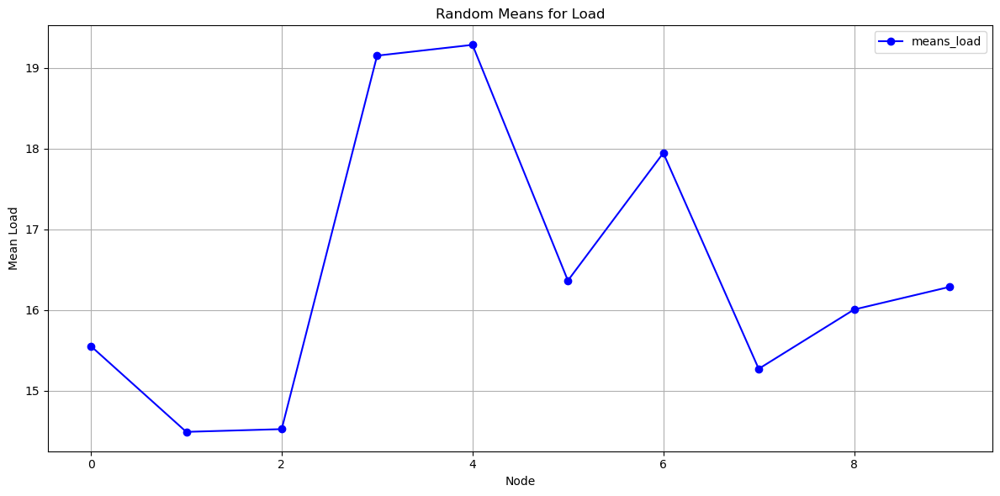

In [48]:
N = 10
T = 1000
mean_load = 15
var_load = 10
thetas = [0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9]
k_values = [1, 2, 5]

means_load = generate_means(N, mean_load, var_load)

# Generate IID data
load_iid, load_iid_means = generate_iid_data(N, T, means_load)

# Generate AR(1) data
# load_ar1, load_ar1_means = generate_ar1_data(N, T, means_load, theta)
load_ar1_thetas = []
load_ar1_means_thetas = []
for theta in thetas:
    load_ar1_theta, load_ar1_means_theta = generate_ar1_data(N, T, means_load, theta)
    load_ar1_thetas.append(load_ar1_theta)
    load_ar1_means_thetas.append(load_ar1_means_theta)

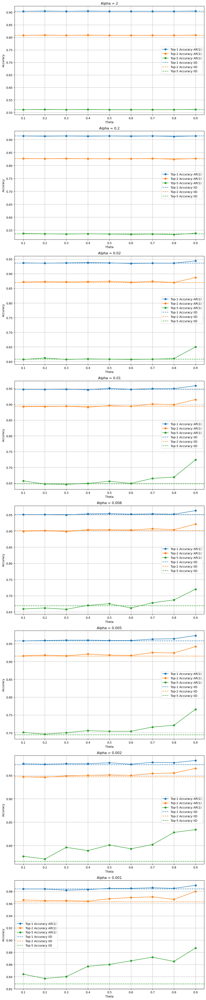

In [49]:
def plot_thetas_top_k(thetas, alpha, ar1_accuracies, iid_accuracies, ax):
    k_values = [1, 2, 5]

    # Prepare data for plotting
    theta_values = np.array(thetas)
    accuracy_values_ar1 = {k: [acc[k] for acc in ar1_accuracies] for k in k_values}

    # Plotting the accuracies
    for k in k_values:
        ax.plot(theta_values, accuracy_values_ar1[k], marker='o', label=f'Top-{k} Accuracy AR(1)')

    # Plotting the iid accuracies as horizontal lines
    for k in k_values:
        ax.axhline(y=iid_accuracies[k], linestyle='--', label=f'Top-{k} Accuracy IID', color=ax.lines[k_values.index(k)].get_color())

    ax.set_xlabel('Theta')
    ax.set_ylabel('Accuracy')
    ax.set_title(f'Alpha = {alpha}')
    ax.legend()
    ax.grid(True)

def plot_diff(alpha, load_iid, load_iid_means, load_ar1_thetas, load_ar1_means_thetas, thetas, ax):
    iid_ucb_regrets, iid_ucb_actions, iid_ucb_accuracies = ucb(load_iid, load_iid_means, alpha)

    all_ar1_ucb_accuracies = []
    for i, theta in enumerate(thetas):
        ar1_ucb_regrets, ar1_ucb_actions, ar1_ucb_accuracies = ucb(load_ar1_thetas[i], load_ar1_means_thetas[i], alpha)
        all_ar1_ucb_accuracies.append(ar1_ucb_accuracies)

    # all_ar1_ucb_accuracies
    plot_thetas_top_k(thetas, alpha, all_ar1_ucb_accuracies, iid_ucb_accuracies, ax)

alphas = [2, 0.2, 0.02, 0.01, 0.008, 0.005, 0.002, 0.001]
num_alphas = len(alphas)

# Create a figure with subplots
fig, axes = plt.subplots(nrows=num_alphas, ncols=1, figsize=(10, 6 * num_alphas))

for ax, alpha in zip(axes, alphas):
    plot_diff(alpha, load_iid, load_iid_means, load_ar1_thetas, load_ar1_means_thetas, thetas, ax)

plt.tight_layout()
fig.savefig('image/UCB Algorithm; Top-k Accuracy for Different Thetas.png')
plt.show()